<a href="https://colab.research.google.com/github/17520299/DS102.L11.CNCL/blob/main/Detectron2-12/15-1%3A30.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# install dependencies: 
!pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.7.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.7)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
import torch
assert torch.__version__.startswith("1.7")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



In [4]:
!wget https://www.dropbox.com/s/vzr55y4lqx7te2b/Dataset.zip
!unzip Dataset.zip

--2020-12-15 05:22:23--  https://www.dropbox.com/s/vzr55y4lqx7te2b/Dataset.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.6.18, 2620:100:6019:18::a27d:412
Connecting to www.dropbox.com (www.dropbox.com)|162.125.6.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/vzr55y4lqx7te2b/Dataset.zip [following]
--2020-12-15 05:22:23--  https://www.dropbox.com/s/raw/vzr55y4lqx7te2b/Dataset.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc87bede5a1015d523ecf1ad1608.dl.dropboxusercontent.com/cd/0/inline/BFHh971YLIADi0qPRNFV9y31dOnqSxcXC_K7cRc54wxnxPDAnXxmiUbZ1kwMtSIGevcLvzbl5aM-IPASPvWLob_ixMgiu9_1BYcN2bXV4z940YXi8W6XcLgbU17ylVCBLVQ/file# [following]
--2020-12-15 05:22:24--  https://uc87bede5a1015d523ecf1ad1608.dl.dropboxusercontent.com/cd/0/inline/BFHh971YLIADi0qPRNFV9y31dOnqSxcXC_K7cRc54wxnxPDAnXxmiUbZ1kwMtSIGevcLvzbl5aM-IPASPvWLob_ixMgiu9_1BYcN2bXV4z940YXi8W

In [5]:
import json
from detectron2.structures import BoxMode
def get_traffic_dicts(imgdir):
  json_file = imgdir+'/data.json'
  with open(json_file) as f:
    dataset_dicts = json.load(f)
  for i in dataset_dicts:
    filename=i['file_name']
    i['file_name'] = imgdir+"/"+filename
    for j in i['annotations']:
      j['bbox_mode'] = BoxMode.XYWH_ABS
      j['category_id'] = int(j['category_id'])
  return dataset_dicts
from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ['Train','Test']:
  DatasetCatalog.register('traffic_'+d,lambda d=d: get_traffic_dicts('/content/Dataset/'+d))
  MetadataCatalog.get('traffic_'+d).set(thing_classes=['pedestrian','car','van','bus','truck','motor','bicycle','tricycle','other'])
traffic_metadata = MetadataCatalog.get('traffic_Train')

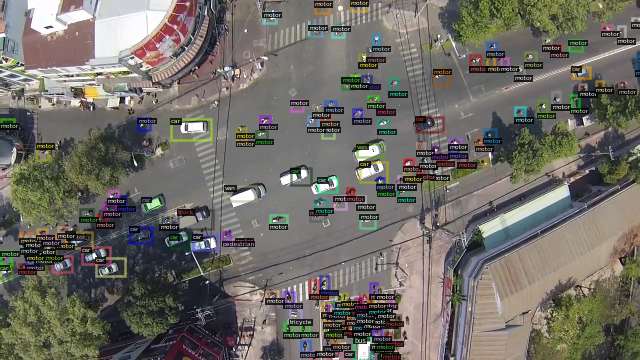

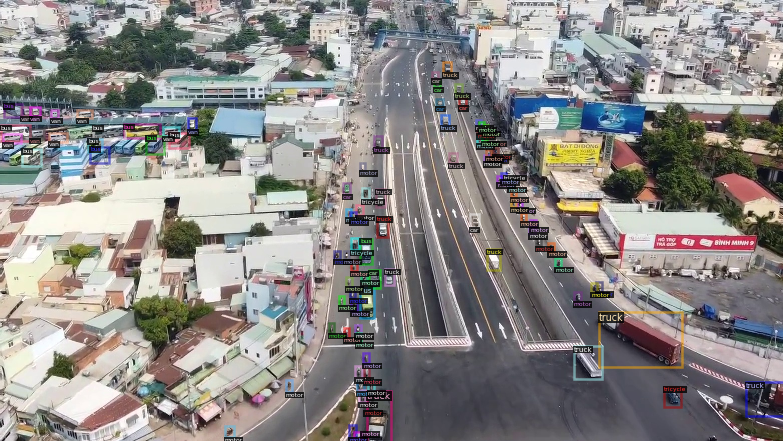

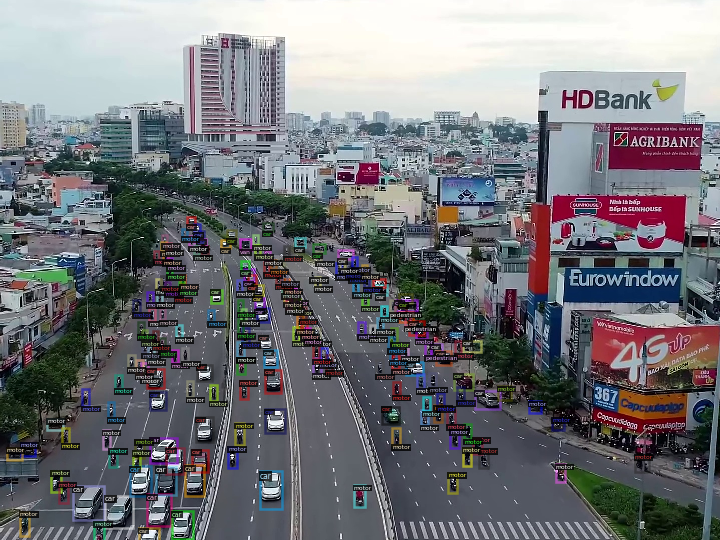

In [6]:
dataset_dicts = get_traffic_dicts('/content/Dataset/Train/')
for d in random.sample(dataset_dicts,3):
  img = cv2.imread(d['file_name'])
  visualizer = Visualizer(img[ :, :, ::-1], metadata=traffic_metadata,scale=0.5)
  vis = visualizer.draw_dataset_dict(d)
  cv2_imshow(vis.get_image()[:,:,::-1])

In [7]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml"))
cfg.DATASETS.TRAIN = ("traffic_Train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url('COCO-Detection/faster_rcnn_R_50_C4_3x.yaml')
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0125
cfg.SOLVER.MAX_ITER = 1500
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 9
cfg.TEST.EVAL_PERIOD = 500

os.makedirs(cfg.OUTPUT_DIR,exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/15 05:24:20 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_f97cb7.pkl: 136MB [00:06, 21.1MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 2048) in the checkpoint but (10, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (10,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 2048) in the checkpoint but (36, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (36,) in the model! You might want to double check if this is expected.


[12/15 05:24:33 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/modeling/roi_heads/fast_rcnn.py:217: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  num_fg = fg_inds.nonzero().numel()


[12/15 05:25:08 d2.utils.events]:  eta: 0:42:44  iter: 19  total_loss: 2.887  loss_cls: 1.91  loss_box_reg: 0.4005  loss_rpn_cls: 0.1931  loss_rpn_loc: 0.3089  time: 1.7309  data_time: 0.0581  lr: 0.00024976  max_mem: 5457M
[12/15 05:25:44 d2.utils.events]:  eta: 0:43:03  iter: 39  total_loss: 1.425  loss_cls: 0.7068  loss_box_reg: 0.4111  loss_rpn_cls: 0.1028  loss_rpn_loc: 0.2246  time: 1.7695  data_time: 0.0149  lr: 0.00049951  max_mem: 5530M
[12/15 05:26:23 d2.utils.events]:  eta: 0:43:28  iter: 59  total_loss: 1.31  loss_cls: 0.5821  loss_box_reg: 0.4058  loss_rpn_cls: 0.09541  loss_rpn_loc: 0.215  time: 1.8226  data_time: 0.0203  lr: 0.00074926  max_mem: 5530M
[12/15 05:27:02 d2.utils.events]:  eta: 0:43:41  iter: 79  total_loss: 1.326  loss_cls: 0.5313  loss_box_reg: 0.4492  loss_rpn_cls: 0.09265  loss_rpn_loc: 0.2441  time: 1.8608  data_time: 0.0146  lr: 0.00099901  max_mem: 5530M
[12/15 05:27:41 d2.utils.events]:  eta: 0:44:28  iter: 99  total_loss: 1.337  loss_cls: 0.5158  lo

In [8]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [9]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

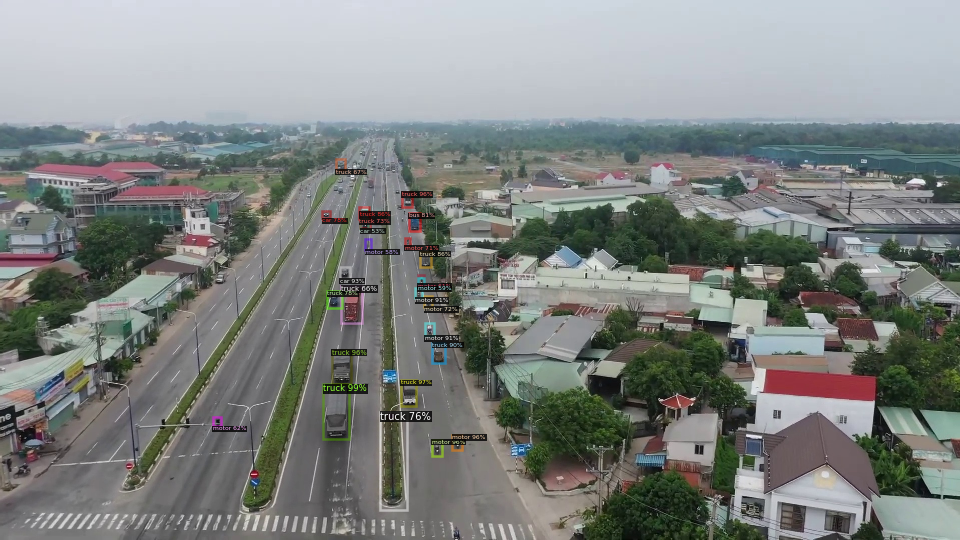

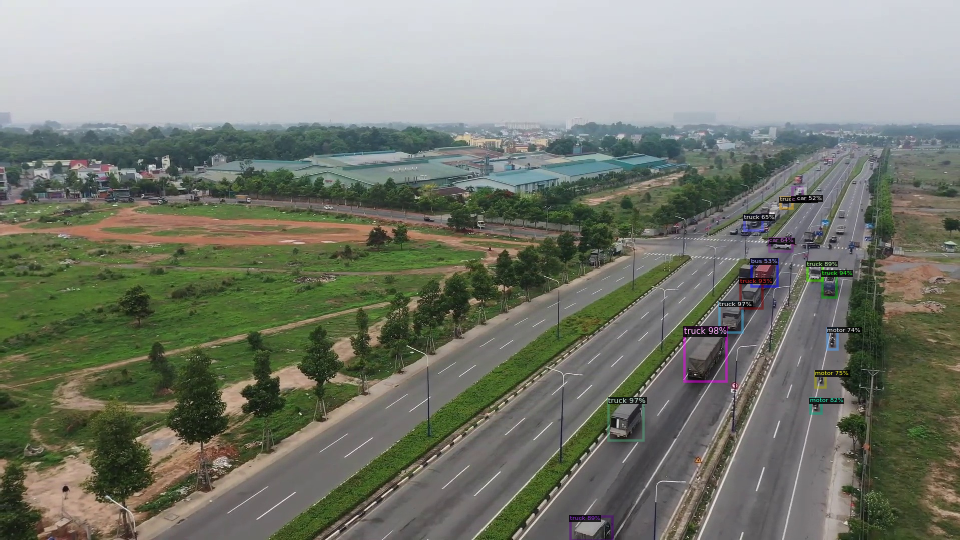

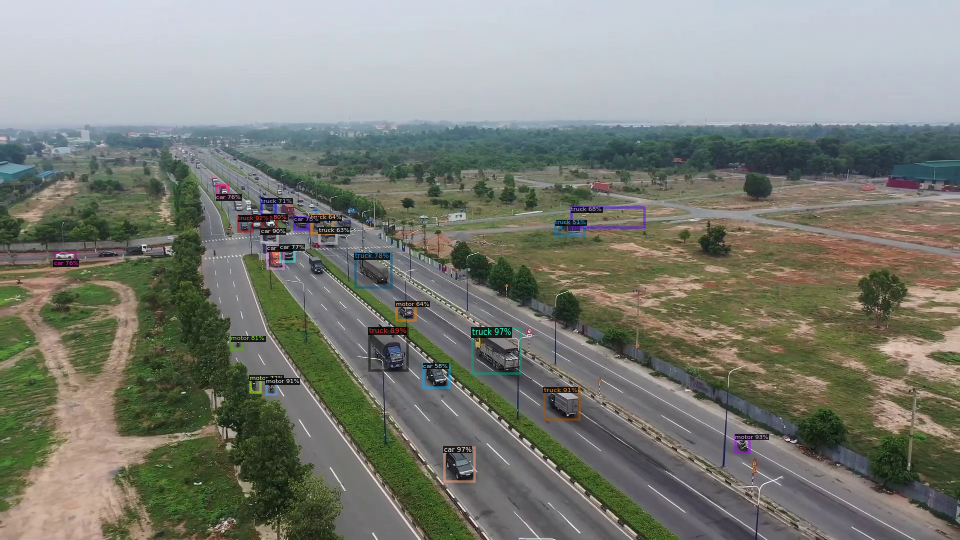

In [15]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_traffic_dicts("/content/Dataset/Test")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=traffic_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [11]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("traffic_Test", cfg, False, output_dir="/output/")
test_loader = build_detection_test_loader(cfg, "traffic_Test")
inference_on_dataset(predictor.model, test_loader, evaluator)
# another equivalent way is to use trainer.test

WARNING [12/15 06:17:41 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass tasks in directly
[12/15 06:17:41 d2.evaluation.coco_evaluation]: 'traffic_Test' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[12/15 06:17:41 d2.data.datasets.coco]: Converting annotations of dataset 'traffic_Test' to COCO format ...)
[12/15 06:17:41 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[12/15 06:17:43 d2.data.datasets.coco]: Conversion finished, #images: 327, #annotations: 23749
[12/15 06:17:43 d2.data.datasets.coco]: Caching COCO format annotations at '/output/traffic_Test_coco_format.json' ...
[12/15 06:17:44 d2.data.build]: Distribution of instances among all 9 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| pedestrian | 103     

OrderedDict([('bbox',
              {'AP': 10.187119557150053,
               'AP-bicycle': 0.0,
               'AP-bus': 24.998387451308872,
               'AP-car': 21.211455494851368,
               'AP-motor': 13.501865663655147,
               'AP-other': 0.0,
               'AP-pedestrian': 0.0,
               'AP-tricycle': 5.559769141453068,
               'AP-truck': 26.412598263082003,
               'AP-van': 0.0,
               'AP50': 20.025336807704196,
               'AP75': 9.069376325162844,
               'APl': 38.73640685573031,
               'APm': 14.449278834629819,
               'APs': 4.346372090889243})])